In [1]:
using Multitaper, Plots, DelimitedFiles, Statistics, StatsBase, LinearAlgebra, Distributions, LombScargle, FINUFFT,
      LaTeXStrings, StatsFuns, NaNStatistics

mdmultispec_noadapt (generic function with 1 method)

### Missing-data multitaper analysis of scallop-shell star EPIC203354381 from  [Dodson-Robinson & Haley (2024)](https://ui.adsabs.harvard.edu/abs/2024AJ....167...22D/abstract) section 5

Light curve analyzed by <a href="https://ui.adsabs.harvard.edu/abs/2018AJ....155...63S/abstract">Stauffer et al. (2018)</a>; no frequency domain

The multitaper power spectrum estimate reveals the harmonic sequence that gives the light curve its complex scallop-shell shape.

For help understanding file-reading and plotting commands, check out [Julia quickstart for astronomers](https://github.com/lootie/Multitaper.jl/blob/master/Julia_quickstart/Julia_quickstart_astronomers.ipynb)

In [2]:
data = readdlm("EPIC203354381.txt", comments=true)
timestamp = data[50:end,1]
time = timestamp .- timestamp[1]
flux = data[50:end,2]

3737-element Vector{Float64}:
 22505.34278857708
 26125.2135367617
 23733.201459296048
 23905.615512624383
 28929.09712265432
 30822.56362105161
 30990.82644464448
 30445.442503605038
 29734.971892654896
 29314.734548851848
 29440.478324905038
 29287.67840640992
 28948.700124278665
     ⋮
 28348.74940636754
 27771.814199119806
 27560.83402261138
 27540.801744908094
 27913.027485460043
 29279.11874333024
 30021.229878216982
 29845.724074155092
 29507.573539584875
 29187.05028191209
 29826.50726184249
 30645.670295625925

#### At BJD-2454833 + 2102, the variability pattern changes

In [3]:
timestamp_cut = 2102

2102

### Plot the time series, indicating the transition between different variability patterns

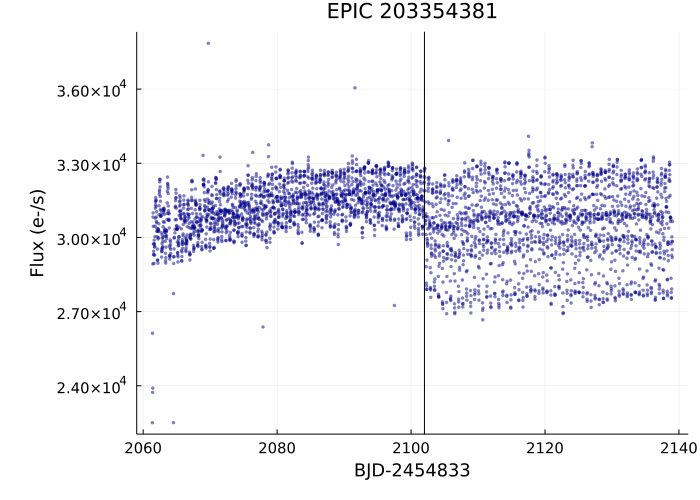

In [4]:
pflux = scatter(timestamp, flux, ylabel="Flux (e-/s)", legend=false, xtickfontsize=10, 
                left_margin = 8Plots.mm, xguidefontsize=12, ytickfontsize=10, 
                yguidefontsize=12, msw=0, title="EPIC 203354381", ma=0.5, ms=2, 
                wsize=(700,500), bottom_margin = 5Plots.mm, color=:darkblue,
                xlabel="BJD-2454833")
vline!([timestamp_cut], color=:black)

### Create a vector of scaled timestamps that have integer values and $\Delta t = 1$

Solving the eigenvalue problem that calculates the Chave tapers requires this type of grid.

In [5]:
dt = diff(time)
tscale = round.(time ./ median(dt))

3737-element Vector{Float64}:
    0.0
    1.0
    2.0
    3.0
    4.0
    5.0
    6.0
    7.0
    8.0
    9.0
   10.0
   11.0
   12.0
    ⋮
 3791.0
 3792.0
 3793.0
 3794.0
 3795.0
 3796.0
 3797.0
 3798.0
 3799.0
 3800.0
 3801.0
 3802.0

### Calculate the missing-data Slepian sequences according to [Chave (2019)](https://academic.oup.com/gji/article/218/3/2165/5519233?login=false)

Syntax of the call to <tt>mdslepian()</tt> (short for missing-data Slepian sequences):
<ul>
    <li>The first argument is the SCALED bandwidth in units where the Nyquist frequency is 0.5, denoted $\varpi$ in <a href="https://ui.adsabs.harvard.edu/abs/2024AJ....167...22D/abstract">Dodson-Robinson & Haley (2024)</a>. See section 2.7 for tips on choosing the bandwidth. Here we set $\varpi$ according to resolution considerations.</li>
    <li>The second argument is the number of tapers $K$.</li>
    <li>The third argument is the vector of INTEGER time indices $t = t_0, t_1, t_2, \ldots, t_{N-1}$ with rescaled $\Delta t = 1$ except where there are gaps.</li>
<ul>

In [6]:
N = length(time)
NW = 6.5
W = NW / N
K = 12
lam, sleps = mdslepian(W, K, tscale)

([0.9895833333331526, 0.9895833333022965, 0.9895833313016332, 0.9895832827154767, 0.9895830842337409, 0.9895799006544115, 0.9895150216882682, 0.9888002692784184, 0.9846176024304563, 0.9790095163489411, 0.963611910873715, 0.9035293430549196], [-2.0152405647011484e-8 -7.364518535973863e-8 … -0.001798831469327418 -0.014662093416222119; -2.036780941822025e-8 -7.203924864973565e-8 … -0.0017526164300667585 -0.01486979035648647; … ; 5.84887705212811e-8 -6.489169540498108e-7 … 0.011532641202695705 0.019636463508529673; 5.5161882041299126e-8 -6.14774419680636e-7 … 0.011391627490608538 0.019478634653362987])

### Identify gaps, print out how many timesteps they cover

In [7]:
gaps = findall(dt .> 3*median(dt))
println(gaps)

for i in 1:length(gaps)
  println(tscale[gaps[i]+1] - tscale[gaps[i]])
end

[135, 143, 305, 343, 2749]
19.0
4.0
3.0
4.0
4.0


### Plot missing-data Slepian sequences; shade gaps

In [8]:
ls = [:solid :dashdot :dash :dot]
lw = [2 2 2 3]

psleps = plot(timestamp, sleps, xlabel="BJD-2454833", ylabel=L"w_t^{(k)}",  
                 xtickfontsize=10, left_margin = 8Plots.mm, ls=ls, lw=lw,
                 xguidefontsize=12, ytickfontsize=10, yguidefontsize=16, legendfontsize=6,
                 titlefontsize=14, wsize=(700,500), bottom_margin = 5Plots.mm, 
                 labels=round.(lam, digits=5)', legend_position=(0.86, 1.27), 
                 title="MDSS: "*L"K = 12, N\varpi = 6.5")


for i in 1:length(gaps)
    for j in 1:K
        plot!([timestamp[gaps[i]], timestamp[gaps[i]+1]], [-0.05, -0.05], 
               fillrange=[0.06, 0.06], lw=4, color=:darkgray, label=false)
    end
end

#### Display plot from cell above

The legend placement looks weird in this plot, but it's in the right place for the combined data/taper plot

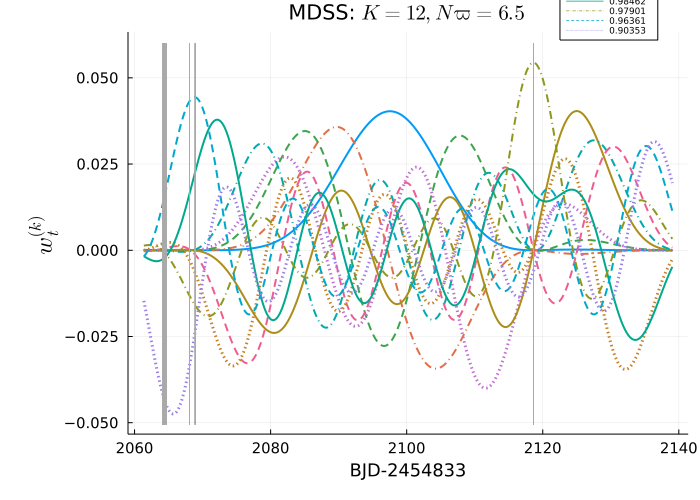

In [9]:
plot(psleps)

### Make a combined plot of data and tapers

This is Figure 12 in the paper. The vertical black line cuts between two modes of variability. We will analyze each separately at the end of the notebook.

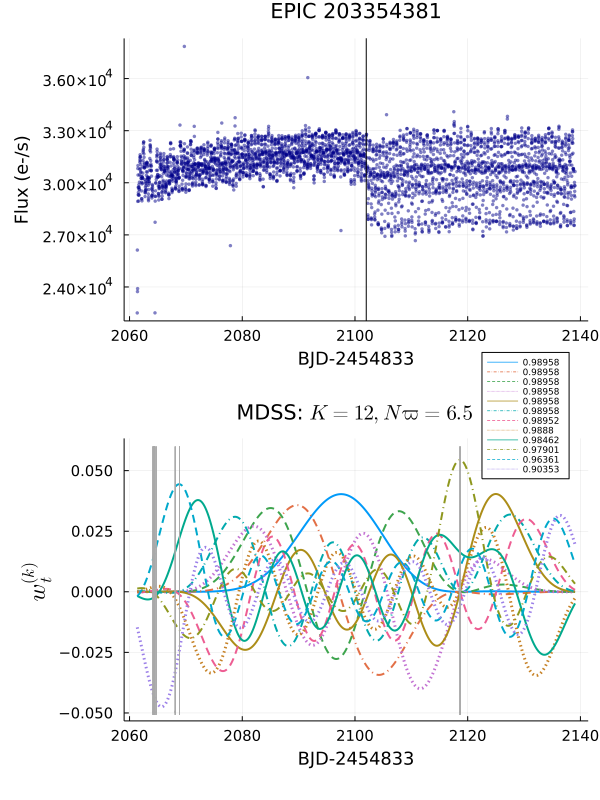

In [10]:
plot(pflux, psleps, layout=(2,1), wsize=(600,800))
# savefig("scallop_data_tapers.png")

### Calculate the multitaper power spectrum

Syntax of the call to <tt>mdmultispec_noadapt()</tt> (missing-data multitaper power spectrum estimate without adaptive weighting):<br />
<ul>
    <li>The first argument is the vector of INTEGER time indices $t = t_0, t_1, t_2, \ldots, t_{N-1}$. We have to pass in the time indices so the software will know where the gaps are.</li>
    <li>The second argument is the vector of observations. Although <tt>Multitaper.jl</tt> will subtract off the time series mean, I have deliberately ingrained the habit of zero-meaning my data anytime I'm doing Fourier analysis.</li>
    <li><tt>bw</tt> is the bandwidth in SCALED units where $\Delta t = 1$ and the Nyquist frequency is 0.5. The default is given by $N\varpi = 5, \varpi = N\varpi / N$.</li>
    <li><tt>k</tt> is the number of tapers. The default is <tt>floor</tt>$(2N\varpi)$.</li>
    <li><tt>nz</tt> tells the software what factor to use in padding the time-domain data / oversampling the frequency grid. The native (Rayleigh) resolution of a power spectrum estimate is $1 / (t_{N-1} - t_0)$, which gives an equal number of frequency gridpoints as observations if the time grid is evenly spaced. Your frequency grid will have length <tt>nz</tt>$\times N$. Equivalent to <tt>samples_per_peak</tt> in <tt>astropy.timeseries.LombScargle</tt>.</li>
        <li>If the physical time interval between observations is something other than 1, pass that in using the <tt>dt</tt> keyword.</li>
</ul>

Defaults are to perform the F-test (<tt>Ftest = true</tt>) and calculate jackknife confidence intervals (<tt>jk = true</tt>). You can turn off either of these calculations with <tt>Ftest = false</tt> and <tt>jk = false</tt>.</li>

The output of <tt>mdmultispec_noadapt()</tt> is a tuple. First in the tuple is a structure of type <tt>MTSpectrum</tt> defined in [<tt>StructsTypes.jl</tt>](https://github.com/lootie/Multitaper.jl/blob/master/src/StructsTypes.jl). In cells 21 and 22, we directly access the structure fields for frequency (<tt>.f</tt>) and p-value given by the F-test at each frequency (<tt>.Fpval</tt>). The spectrum is in field <tt>.S</tt>. Second in the tuple is the degrees of freedom $\nu$, which we will not need here.

See the [<tt>Examples</tt>](https://github.com/lootie/Multitaper.jl/blob/master/Examples/01_basic_multitaper.ipynb) directory for more power spectrum estimates.

In [11]:
mtspec, nu = mdmultispec_noadapt(tscale, flux .- mean(flux), bw=W, k=K, nz=4,
                                 dt=median(dt))

(MTSpectrum{EigenCoefficient, Vector{Float64}, Nothing}(0.0:0.00261869821447434:24.471734814262707, [1.6049045082299984e6, 3.1766415322305737e6, 3.209809016459998e6, 3.2574443792229076e6, 3.2341517817817237e6, 3.139676303789737e6, 3.0694224896352105e6, 3.099989118623765e6, 3.195157750621751e6, 3.2513530325649404e6  …  2007.167340631051, 2055.0714647506575, 2043.769607231469, 1990.3921630247207, 1921.4308781262653, 1861.5491047098776, 1823.7853729235746, 1808.023026007511, 1806.6170206415266, 905.220420341239], nothing, MTParameters(6.5, 12, 3737, 1.0, 18690, 1, nothing), EigenCoefficient(ComplexF64[-13133.539926221161 + 6785.280361753594im -17545.11319836712 + 10645.604198642626im … 3086.8285408442875 - 2607.48776126166im 6113.164156945955 + 1014.4022970574065im; 14714.613175337283 + 9.702489989047647e-13im 20794.977147417983 + 3.4824072176906146e-13im … -4827.946627997685 - 8.810909827891917e-14im -4854.2460258045885 + 4.1274916872327017e-13im; … ; 99.46478226296382 - 131.843385805854

### Quick power spectrum plot

<tt>Multitaper.jl</tt> has a plot recipe for power spectra packaged in an MTSpectrum structure.

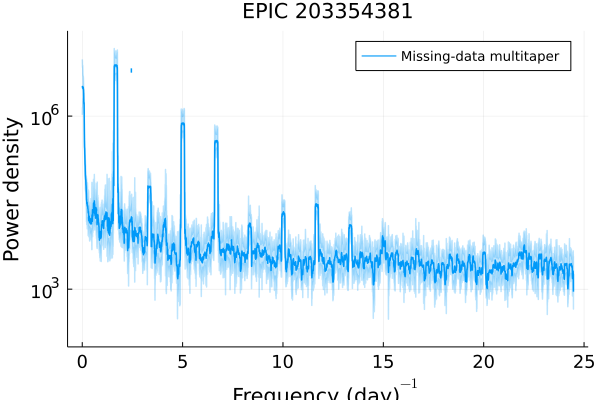

In [12]:
specplot = plot(mtspec, xlabel="Frequency (day)"*L"^{-1}", ylabel="Power density", 
                label="Missing-data multitaper", title="EPIC 203354381", lw=1.5, 
                xtickfontsize=12, ytickfontsize=12, xguidefontsize=14, yguidefontsize=14, 
                legendfontsize=9, ylim=(100,3e7))

### Identify statistically significant signals

Recommended F test p-value threshold is 1/N, which is corresponds to a significance level of 1-1/N. From Thomson (1990).

In [13]:
threshold = 1/N
sigN = findall(mtspec.Fpval .< threshold)

30-element Vector{Int64}:
  638
  639
  640
  641
  831
 1278
 1279
 1280
 1912
 1913
 1914
 1915
 2550
    ⋮
 3825
 3826
 3827
 4462
 4463
 4464
 4465
 5100
 5736
 5737
 8709
 8710

### Calculate the Lomb-Scargle periodogram
#### 1/N false alarm threshold for Lomb-Scargle periodogram was calculated with <tt>astropy</tt> by bootstrap because <tt>LombScargle.jl</tt> won't compute false alarm thresholds for power spectrum normalization

In [14]:
lsp = lombscargle(time, flux, normalization=:psd, nyquist_factor=1)
fls, pls = freqpower(lsp)
LSthreshold = 1.18803057e+08 # This is the 1/N false alarm level calculated using astropy

1.18803057e8

### Make a nice plot of the missing-data multitaper power spectrum and F test p-value

Significant signals are identified by green stars. Top two plots aren't given x-axis labels.

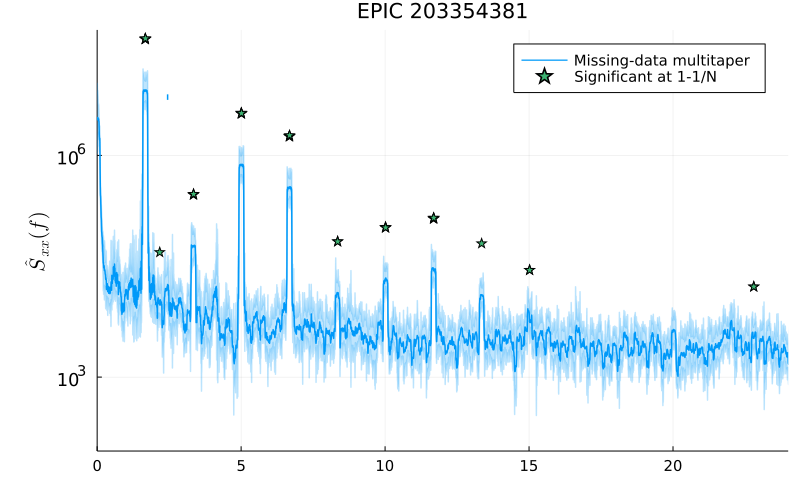

In [15]:
prettyspecplot = plot(mtspec, ylabel=L"\hat{S}_{xx}(f)", 
                      label="Missing-data multitaper", lw=1.5, 
                      xtickfontsize=10, ytickfontsize=12, xguidefontsize=14, 
                      yguidefontsize=14, legendfontsize=10, wsize=(800,500), 
                      left_margin=8Plots.mm, xlabel=" ", xlim=(0,24),
                      ylim=(100, 5e7), title="EPIC 203354381")
scatter!(mtspec.f[sigN], 5 .* mtspec.S[sigN], label="Significant at 1-1/N", 
         marker=:star5, markersize=5, color=:mediumseagreen)

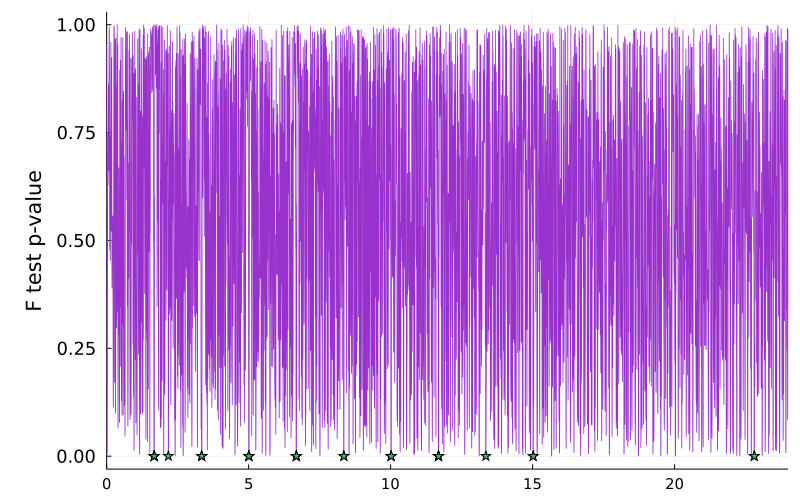

In [16]:
Fplot = plot(mtspec.f, mtspec.Fpval, color=:darkorchid, ylabel="F test p-value", 
             lw=0.8, xtickfontsize=10, ytickfontsize=12, xlim=(0,24),
             xguidefontsize=14, yguidefontsize=14, legend=false, wsize=(800,500), 
             left_margin=8Plots.mm)

scatter!(mtspec.f[sigN], mtspec.Fpval[sigN], label=false, marker=:star5, 
         markersize=5, color=:mediumseagreen)

### Plot the Lomb-Scargle periodogram on top of the multitaper confidence intervals

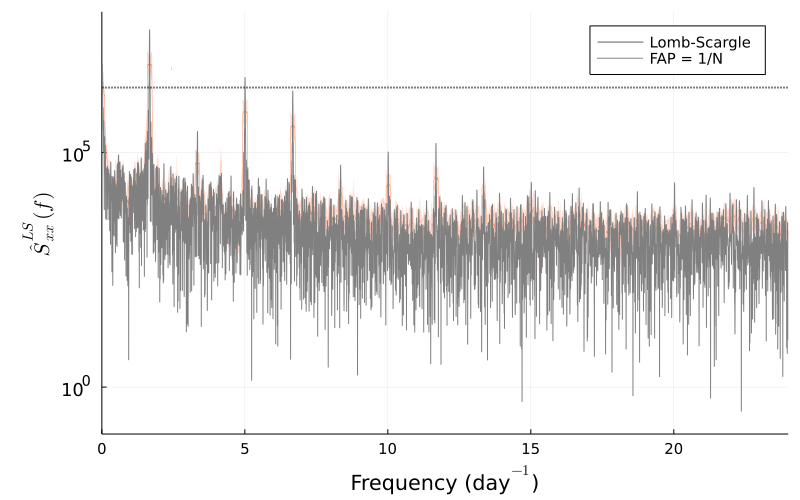

In [17]:
lombscspecplot = plot(mtspec, ylabel=L"\hat{S}^{LS}_{xx}(f)", 
                      label=false, lw=0.3, color=:coral, 
                      xtickfontsize=10, ytickfontsize=12, xguidefontsize=14, 
                      yguidefontsize=14, legendfontsize=10, wsize=(800,500), 
                      left_margin=8Plots.mm, xlim=(0,24), bottom_margin=5Plots.mm,
                      ylim=(0.1, 1e8), xlabel="Frequency (day"*L"^{-1}"*")",)

plot!(fls, pls .* median(dt), label="Lomb-Scargle", color=:gray)

hline!([LSthreshold .* median(dt)], color=:black, ls=:dot, lw=2, label="FAP = 1/N")

### Combine the missing-data multitaper, F-test, and Lomb-Scargle plots into a three-panel plot

This is Figure 14 of [Dodson-Robinson & Haley (2024)](https://ui.adsabs.harvard.edu/abs/2024AJ....167...22D/abstract)

In [18]:
plot(prettyspecplot, Fplot, lombscspecplot, layout=(3, 1), wsize=(700, 900))
# savefig("scallop_spectra.png")

### Calculate the spectral window of the missing-data multitaper estimator

In [19]:
Nf = 2 * length(mtspec.f)
fgrid = collect(LinRange(-24, 24, Nf))
specwin = zeros(Nf)
for k in 1:K
    specwin = specwin + abs2.(nufft1d3(2 .* pi .*time, ComplexF64.(sleps[:,k]), -1, 1e-15, fgrid))
end
specwin = specwin ./ K

18692×1 Matrix{Float64}:
 0.03025515738461822
 0.03061460493087235
 0.03104029221287984
 0.03106262717169309
 0.030713791609831075
 0.030443044431630293
 0.030553551096252296
 0.030864387681983463
 0.03098168822721056
 0.03079942283587429
 0.030596482164600605
 0.030639661142399712
 0.03083027175725207
 ⋮
 0.030639661142399646
 0.0305964821646007
 0.030799422835874484
 0.030981688227210518
 0.030864387681982835
 0.030553551096252397
 0.030443044431630446
 0.030713791609832036
 0.031062627171694293
 0.031040292212878875
 0.030614604930871203
 0.030255157384618217

### Separate analysis of early and late parts of time series (divided by black vertical line on scatter plot)

Here we follow all of the same steps as in the analysis of the entire time series

In [20]:
early = findall(timestamp .< timestamp_cut)
late = findall(timestamp .>= timestamp_cut)
time_early = time[early]
time_late = time[late]
flux_early = flux[early]
flux_late = flux[late]

1793-element Vector{Float64}:
 32675.588357061148
 32773.62040260434
 32792.84751686454
 32407.22047135234
 31894.127083033323
 31427.857849031687
 30662.120276540518
 30540.359550327063
 30689.74608334899
 30862.777637392282
 30962.128542035818
 30841.880213171244
 30117.31079491973
     ⋮
 28348.74940636754
 27771.814199119806
 27560.83402261138
 27540.801744908094
 27913.027485460043
 29279.11874333024
 30021.229878216982
 29845.724074155092
 29507.573539584875
 29187.05028191209
 29826.50726184249
 30645.670295625925

In [21]:
tscale_early = tscale[early]
tscale_late = tscale[late]
tscale_late = tscale_late .- tscale_late[1]
println(tscale_early[1:10])
println(tscale_late[1:10])
N_early = length(tscale_early)
N_late = length(tscale_late)
println("N_early: $(N_early), N_late: $(N_late)")

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]
[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]
N_early: 1944, N_late: 1793


### Separate multitaper power spectrum estimates for early and late parts of time series

Note that for the same time-bandwidth product $N\varpi = 4$, the two bandwidths $\varpi$ are slightly different, given that each half of the time series has a different $N$

In [22]:
NW_cut = 4
W_early = NW_cut / N_early
W_late = NW_cut / N_late
K_cut = 6
lam_early, sleps_early = mdslepian(W_early, K_cut, tscale_early)
lam_late, sleps_late = mdslepian(W_late, K_cut, tscale_late)
println("$(lam_early), $(lam_late)")

[0.9895833262381031, 0.9895828498438841, 0.9895633370638893, 0.9890636798285665, 0.9834771275137302, 0.9634382796572917], [0.9895832416755045, 0.9895825359285765, 0.9895632232247059, 0.9891556023789566, 0.9847964068587064, 0.976226810641762]


In [23]:
multispec_early, nu = mdmultispec_noadapt(tscale_early, 
                                          flux_early .- mean(flux_early), bw=W_early, 
                                          k=K_cut, nz=4, dt=median(dt))

multispec_late, nu = mdmultispec_noadapt(tscale_late, 
                                         flux_late .- mean(flux_late), bw=W_late, 
                                         k=K_cut, nz=4, dt=median(dt))

(MTSpectrum{EigenCoefficient, Vector{Float64}, Nothing}(0.0:0.005456351129155565:24.471734814262707, [67918.95907464898, 138324.07180830862, 135837.91814929794, 131801.24600057612, 132837.03593101568, 141450.11569313632, 152275.58251208457, 155992.4337371006, 147793.11781844395, 132339.31586822425  …  1284.379409586453, 1087.4447924185772, 914.865173796506, 787.711390511169, 703.4470604692874, 653.6457306734073, 635.9577813105444, 650.1417930292308, 686.9278254090774, 362.4570963112317], nothing, MTParameters(4.0, 6, 1793, 1.0, 8970, 1, nothing), EigenCoefficient(ComplexF64[-971.8839186693964 + 1155.8975772827862im -63.671922360024176 + 767.4992091533006im … -2673.1095633016366 + 883.7584985109914im -250.1615016878709 - 453.943691850731im; 1532.8499429001658 + 0.0im 489.84444733367025 + 0.0im … 3031.934088836493 + 0.0im 127.11422468500888 + 0.0im; … ; 32.86626932951011 - 17.03759392207046im -119.50925664306021 + 84.23885139278848im … 79.7639673775272 + 96.82861625400233im -58.708541440

#### Plot both sets of Slepian sequences

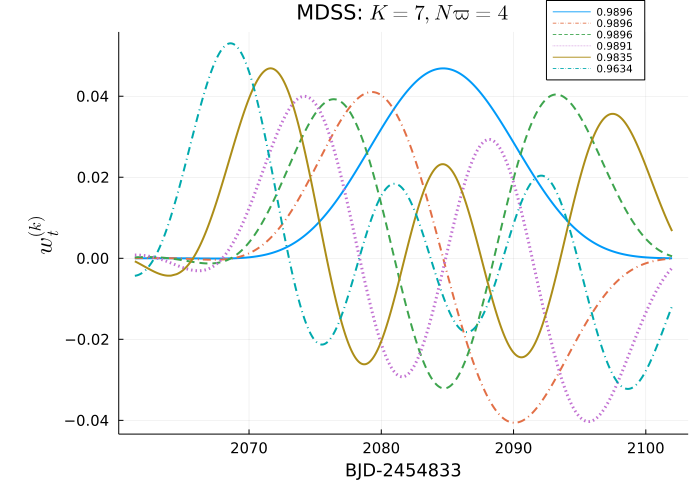

In [24]:
psleps_early = plot(timestamp[early], sleps_early, xlabel="BJD-2454833", ylabel=L"w_t^{(k)}",  
                 xtickfontsize=10, left_margin = 8Plots.mm, lw=lw, ls=ls,
                 xguidefontsize=12, ytickfontsize=10, yguidefontsize=16, legendfontsize=7,
                 titlefontsize=14, wsize=(700,500), bottom_margin = 5Plots.mm, 
                 labels=round.(lam_early, digits=4)', legend_position=(0.84, 1.05), 
                 title="MDSS: "*L"K = 7, N\varpi = 4")

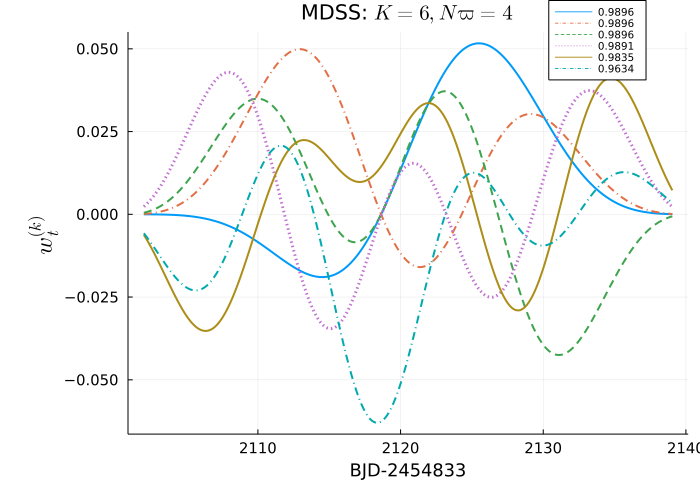

In [25]:
psleps_late = plot(timestamp[late], sleps_late, xlabel="BJD-2454833", ylabel=L"w_t^{(k)}",  
                 xtickfontsize=10, left_margin = 8Plots.mm, lw=lw, ls=ls,
                 xguidefontsize=12, ytickfontsize=10, yguidefontsize=16, legendfontsize=7,
                 titlefontsize=14, wsize=(700,500), bottom_margin = 5Plots.mm, 
                 labels=round.(lam_early, digits=4)', legend_position=(0.84, 1.05), 
                 title="MDSS: "*L"K = 6, N\varpi = 4")

#### Find significant signals

In [26]:
threshold_early = 1 / N_early
threshold_late = 1 / N_late
sigN_early = findall(multispec_early.Fpval .< threshold_early)
sigN_late = findall(multispec_late.Fpval .< threshold_late)

29-element Vector{Int64}:
  307
  308
  309
  613
  614
  615
  919
  920
  921
 1006
 1028
 1225
 1226
    ⋮
 2143
 2144
 2448
 2449
 3060
 3672
 3673
 3674
 4045
 4046
 4461
 4462

#### Plot power spectrum estimates from early and late data

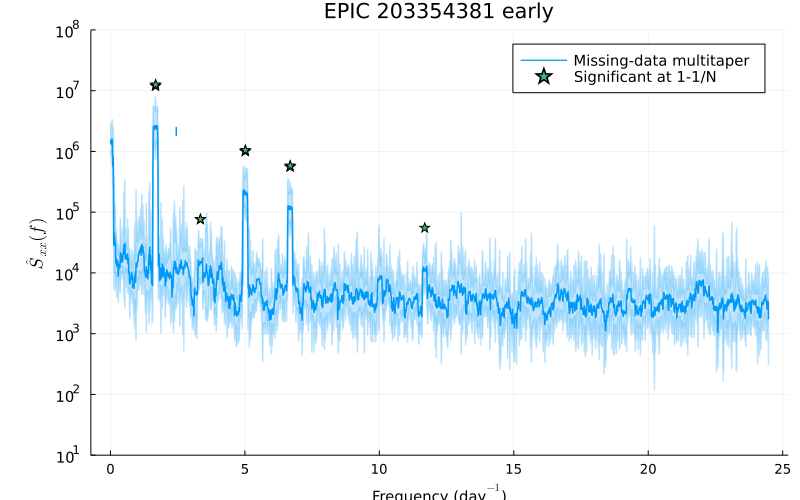

In [27]:
prettyspecplot_early = plot(multispec_early, ylabel=L"\hat{S}_{xx}(f)", 
                           label="Missing-data multitaper", lw=1.5, 
                           xtickfontsize=9, ytickfontsize=10, xguidefontsize=10, 
                           yguidefontsize=12, legendfontsize=10, wsize=(800,500), 
                           left_margin=8Plots.mm, 
                           ylim=(10, 1e8), title="EPIC 203354381 early",
                           xlabel="Frequency (day"*L"^{-1}"*")")
scatter!(multispec_early.f[sigN_early], 5 .* multispec_early.S[sigN_early], label="Significant at 1-1/N", 
         marker=:star5, markersize=5, color=:mediumseagreen)

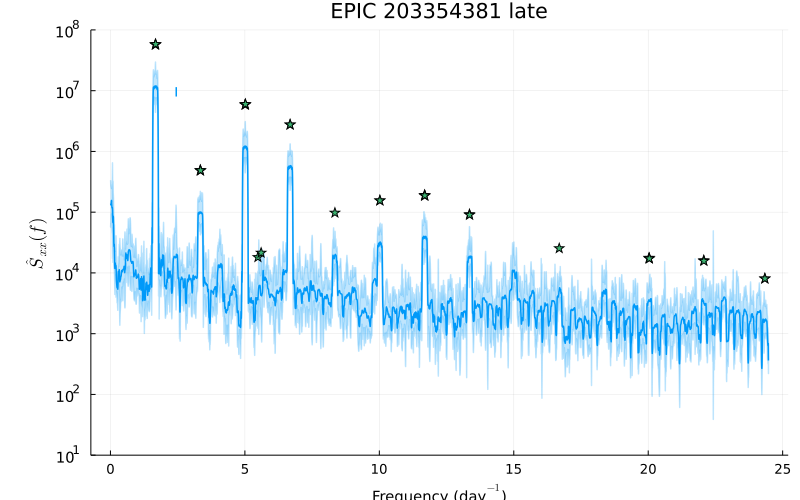

In [28]:
prettyspecplot_late = plot(multispec_late, ylabel=L"\hat{S}_{xx}(f)", 
                           lw=1.5, 
                           xtickfontsize=9, ytickfontsize=10, xguidefontsize=10, 
                           yguidefontsize=12, legend=false, wsize=(800,500), 
                           left_margin=8Plots.mm, xlabel="Frequency (day"*L"^{-1}"*")",
                           ylim=(10, 1e8), title="EPIC 203354381 late")
scatter!(multispec_late.f[sigN_late], 5 .* multispec_late.S[sigN_late], label="Significant at 1-1/N", 
         marker=:star5, markersize=5, color=:mediumseagreen)

This is Figure 15 of [Dodson-Robinson & Haley (2024)](https://ui.adsabs.harvard.edu/abs/2024AJ....167...22D/abstract)

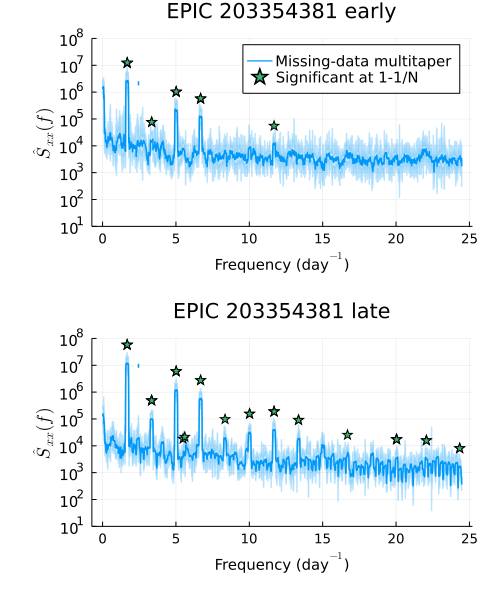

In [29]:
plot(prettyspecplot_early, prettyspecplot_late, layout=(2,1), bottom_margin=5Plots.mm,
     right_margin=5Plots.mm, wsize=(500,600))
# savefig("scallop_early_late_spectra.png")

#### Print out some information about the significant signals

In [30]:
for i in 2:length(sigN_early)
    println(multispec_early.f[sigN_early[i]] - multispec_early.f[sigN_early[i-1]], " ",
            multispec_early.f[sigN_early[i]] / multispec_early.f[sigN_early[1]])
end

for i in 2:length(sigN_late)
    println(multispec_late.f[sigN_late[i]] - multispec_late.f[sigN_late[i-1]], " ",
            multispec_late.f[sigN_late[i]] / multispec_late.f[sigN_late[1]])
end

0.005035336381535638 1.0030120481927711
0.005035336381535416 1.0060240963855422
1.661661005906727 2.0
0.00503533638153586 2.003012048192771
1.6616610059067267 2.996987951807229
0.005035336381535416 3.0
0.005035336381535416 3.003012048192771
1.6566256695251917 3.9939759036144578
0.005035336381535416 3.996987951807229
0.005035336381535416 4.0
5.000089026864789 6.990963855421687
0.0054563511291556566 1.0032679738562091
0.0054563511291554345 1.0065359477124183
1.6587307432632916 2.0
0.0054563511291556566 2.003267973856209
0.0054563511291556566 2.0065359477124183
1.6587307432632916 3.0
0.0054563511291556566 3.003267973856209
0.0054563511291556566 3.0065359477124187
0.4637898459782228 3.2843137254901964
0.12003972484142267 3.356209150326798
1.0749011724436457 4.0
0.0054563511291556566 4.003267973856209
1.6641870943924477 5.0
1.6696434455216025 6.0
0.005456351129154768 6.003267973856209
1.658730743263293 6.996732026143792
0.005456351129154768 7.0
0.005456351129154768 7.003267973856209
1.65873

#### Calculate the spectral window of the multitaper power spectrum estimate from the "late" data (after the cutoff)

In [31]:
specwin_late = zeros(Int64(Nf/2))
fgrid_late = collect(LinRange(-24, 24, Int64(Nf/2)))
for k in 1:K_cut
    specwin_late = specwin_late + abs2.(nufft1d3(2 .* pi .* time_late, 
                                        ComplexF64.(sleps_late[:,k]), -1, 1e-15, fgrid_late))
end
specwin_late = specwin_late ./ K_cut

9346×1 Matrix{Float64}:
 0.03041976841285421
 0.029515373851203928
 0.029281868906481337
 0.029856157625034116
 0.03065054007657973
 0.030966951412359587
 0.030678942974642794
 0.030324454781568352
 0.030523443254692095
 0.03129796321291079
 0.03198504071960725
 0.03186290954267552
 0.030893912358063737
 ⋮
 0.03186290954267606
 0.03198504071960681
 0.031297963212909966
 0.030523443254692334
 0.030324454781568713
 0.03067894297464253
 0.030966951412359778
 0.03065054007657987
 0.02985615762503531
 0.029281868906481795
 0.029515373851204427
 0.030419768412853796

In [32]:
bw_late = round(W_late, digits=4)
print(bw_late)

0.0022

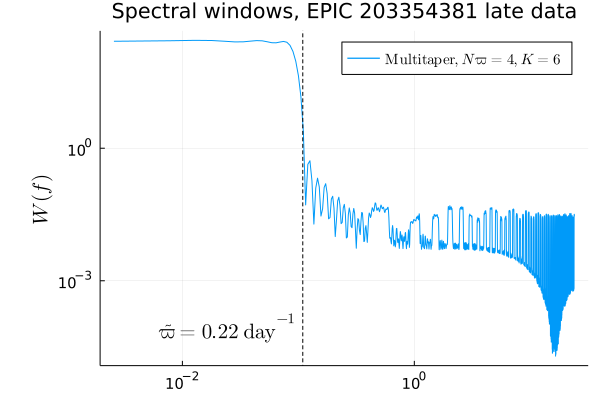

In [33]:
grid_middle = Int64(length(fgrid_late) / 2) + 1

winplot_late = plot(fgrid_late[grid_middle:end], specwin_late[grid_middle:end], 
                   ylabel=L"W(f)", title="Spectral windows, EPIC 203354381 late data", 
                   label=L"\operatorname{Multitaper}, N\varpi = 4, K = 6", 
                   xtickfontsize=10, ytickfontsize=10, 
                   xguidefontsize=12, yguidefontsize=14, legendfontsize=10, 
                   left_margin=8Plots.mm, yscale=:log10, 
                   xscale=:log10)

vline!([W_late / median(dt)], color=:black, ls=:dash, label=false)

annotate!(2.5e-2, 1e-4, L"\tilde{\varpi} = 0.22 \; \operatorname{day}^{-1}", fontsize=8)

plot(winplot_late)

#### Calculate Lomb-Scargle periodogram from late data

In [34]:
lswin_late = lombscargle(time_late, ones(N_late) ./ sqrt(N_late), normalization=:psd, 
                         nyquist_factor=1, center_data=false, fit_mean=false)
flswin_late, plswin_late = freqpower(lswin_late)

(0.0026995919071544842:0.0053991838143089685:24.196442263825645, [0.49988931913423484, 0.48969551585308935, 0.40477540350661034, 0.17124170399269664, 0.012730975833097055, 0.007812851975169078, 0.03601190557204345, 0.0458321388645808, 0.025542737381710652, 0.0028658739706099493  …  2.2081522893650372e-6, 2.203187180579391e-6, 1.3028683544701577e-6, 3.1712509623623165e-7, 1.4267168605192218e-8, 3.2320755194485896e-7, 5.78971141067451e-7, 5.123514452105152e-7, 5.071258259419254e-7, 9.929059073306268e-7])

#### Calculate and print the spectral concentrations of each spectral window applied to the late data (multitaper and Lomb-Scargle)

In [35]:
tildeW_late = W_late / median(dt)
lowf_LS = findall(flswin_late .< tildeW_late)
println("Lomb-Scargle spectral concentration in W: $(sum(plswin_late[lowf_LS]) / sum(plswin_late))")

lowf_MT = findall(fgrid_late[grid_middle:end] .< tildeW_late)
println("Multitaper spectral concentration in W: $(sum(specwin_late[grid_middle:end][lowf_MT]) / sum(specwin_late[grid_middle:end]))")

Lomb-Scargle spectral concentration in W: 0.9479808977968707
Multitaper spectral concentration in W: 0.9864932150816614


#### Plot the Lomb-Scargle spectral window from the late data along with the multitaper bandwidth

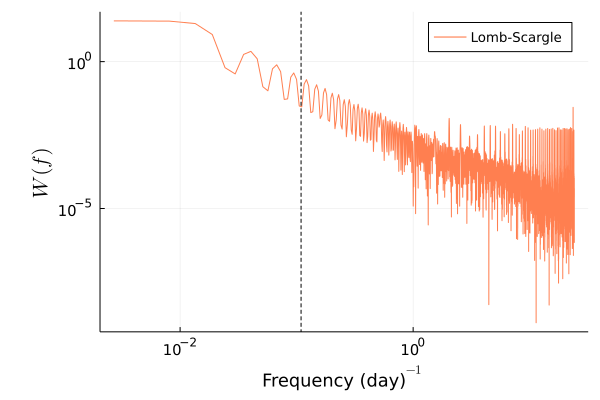

In [36]:
winplot_LS_late = plot(flswin_late, plswin_late ./ median(dt), 
                       xlabel="Frequency (day)"*L"^{-1}", ylabel=L"W(f)", 
                       label="Lomb-Scargle", 
                       xtickfontsize=10, ytickfontsize=10, 
                       xguidefontsize=12, yguidefontsize=14, legendfontsize=9, 
                       left_margin=8Plots.mm, bottom_margin=5Plots.mm, yscale=:log10, 
                       xscale=:log10, color=:coral)

vline!([W_late / median(dt)], color=:black, ls=:dash, label=false)

This figure didn't make it into the paper, but it's illustrative of how well multitaper concentrates power within the bandwidth

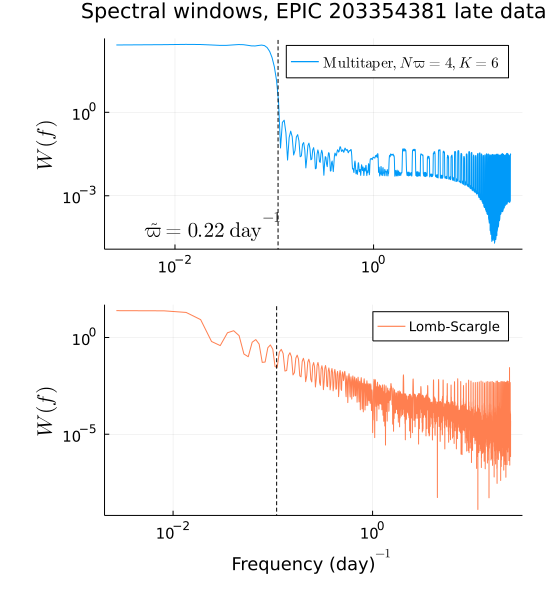

In [37]:
plot(winplot_late, winplot_LS_late, layout=(2,1), wsize=(550,600), right_margin=5Plots.mm)
# savefig("scallop_spectral_windows.png")

#### Print out the different sets of modes discovered in the early and late data

In [38]:
println("Modes from early data: $(multispec_early.f[sigN_early])")
println("Modes from late data: $(multispec_late.f[sigN_late[1:12]])")

Modes from early data: [1.671731678669798, 1.6767670150513336, 1.681802351432869, 3.343463357339596, 3.348498693721132, 5.010159699627859, 5.015195036009394, 5.020230372390929, 6.676856041916121, 6.681891378297657, 6.686926714679192, 11.68701574154398]
Modes from late data: [1.6696434455216027, 1.6750997966507584, 1.6805561477799138, 3.3392868910432054, 3.344743242172361, 3.3501995933015167, 5.008930336564808, 5.014386687693964, 5.01984303882312, 5.4836328848013425, 5.603672609642765, 6.678573782086411]


In [39]:
println("Low-frequency modes from entire data: $(mtspec.f[sigN[1:5]])")

Low-frequency modes from entire data: [1.6681107626201546, 1.6707294608346288, 1.6733481590491033, 1.6759668572635775, 2.1735195180137024]


### Find the fundamental frequency of the rotational modulation from the multitaper power spectrum estimates

In [40]:
fold_frequency = mean(vcat(multispec_early.f[sigN_early[1]], multispec_late.f[sigN_late[1:2]]))
println(fold_frequency)

1.6721583069473862


In [41]:
fold_period = 1/fold_frequency
println("Fold period: $(fold_period) days")

Fold period: 0.5980295022578054 days


### Function to fold the data over a specified period

In [42]:
function fold(timestamps::Vector{Float64}, data::Vector{Float64}, period::Union{Int64, Float64})
    phase = (timestamps .% period) ./ period
    fold_indices = sortperm(phase)
    return phase[fold_indices], data[fold_indices]
end

fold (generic function with 1 method)

### Function to find the best-fit folding period

Uses a "brute-force" method: 
<ol>
    <li>calculates a folded light curve from each period in a user-defined range</li>
    <li>high-pass filters the folded light curve by subtracting off a moving average</li>
    <li>calculates the variance of the folded, high-pass-filtered light curve</li>
</ol>
The period that produces the lowest variance wins.

The first two arguments are the timestamps and the observations, respectively. The user defines the range of periods to test using the next two arguments, <tt>min_period</tt>, and <tt>max_period</tt>. The keyword <tt>window_length</tt> sets the number of data points to use in the moving average. The keyword <tt>N_try</tt> sets the number of periods to test.

In [43]:
function find_fold_period(timestamps::Vector{Float64}, data::Vector{Float64}, 
                          min_period::Float64, max_period::Float64; 
                          window_length::Int64=100, N_try::Int64=100)
    periods = collect(LinRange(min_period, max_period, N_try))
    vars = zeros(N_try)
    for n in 1:N_try
       t_folded, data_folded = fold(timestamps, data, periods[n])
       smoothed = movmean(data_folded, window_length)
       vars[n] = var(data_folded .- smoothed)
    end
    best_fold_period = findmin(vars)
    println("Best-fit fold period: $(periods[best_fold_period[2]])")
     # Return test periods and variances of high-pass-filtered light curves so we can plot them
    return periods, vars
end

find_fold_period (generic function with 1 method)

#### Find the best fold period for the early data

Note that we are searching within a very narrow range of periods

In [44]:
tested_pers, model_vars = find_fold_period(time_early, flux_early, 0.595, 0.605, 
                                           window_length=200, N_try=200)

Best-fit fold period: 0.5991206030150753


([0.595, 0.5950502512562813, 0.5951005025125627, 0.5951507537688442, 0.5952010050251255, 0.5952512562814071, 0.5953015075376884, 0.5953517587939698, 0.5954020100502513, 0.5954522613065326  …  0.6045477386934673, 0.6045979899497487, 0.6046482412060301, 0.6046984924623116, 0.6047487437185929, 0.6047989949748744, 0.6048492462311558, 0.6048994974874372, 0.6049497487437187, 0.605], [767058.8150925749, 764102.9860776584, 756236.0731561347, 753332.9274269802, 748876.3486973267, 744345.3025333266, 740848.3060394244, 736409.2281446931, 730724.6809098813, 725962.0041491077  …  860386.6824122173, 864096.6234413724, 869233.1481971418, 873563.3915290223, 884467.233553626, 889124.2880945774, 887988.2157990725, 885215.8835488039, 887839.3067667702, 889885.3461641966])

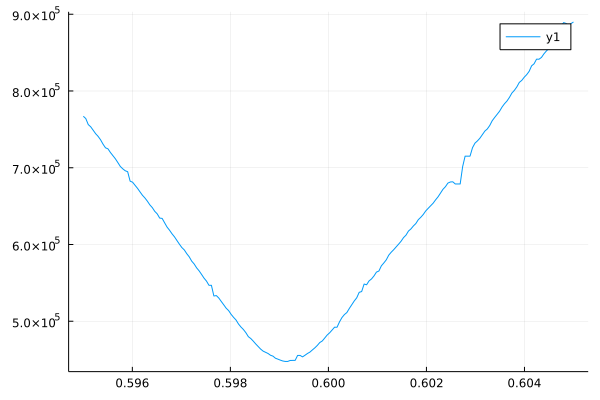

In [45]:
plot(tested_pers, model_vars)

#### Get the phase-folded light curve from the early data, apply the moving average

In [46]:
phase_early, flux_early_folded = fold(time_early, flux_early, 0.599120603)
smoothed = movmean(flux_early_folded, 200)

1944-element Vector{Float64}:
 31373.107103698767
 31367.553713430523
 31372.953679824484
 31370.75114098578
 31375.666002790844
 31373.300886949877
 31373.745282469266
 31376.142920724807
 31379.260763287853
 31381.06515712823
 31378.010196450898
 31376.854669781966
 31379.36831039365
     ⋮
 32062.82246978072
 32062.06451858812
 32058.65669711371
 32056.41468505688
 32056.520546059815
 32052.89162675427
 32050.84926992391
 32043.32943674372
 32050.123645788954
 32045.58933418226
 32052.669024288254
 32048.80316185837

#### This plot is a sanity check to make sure the moving average is behaving as expected

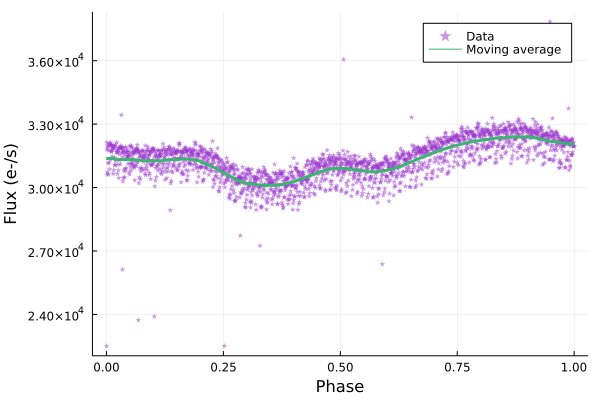

In [47]:
scatter(phase_early, flux_early_folded, marker=:star5, color=:darkorchid, msw=0,
        xlabel="Phase", ylabel="Flux (e-/s)", label="Data", markersize=3, alpha=0.5)
plot!(phase_early, smoothed, color=:mediumseagreen, label="Moving average", lw=3)

#### Find the best-fit fold period from the late data

In [48]:
tested_pers_late, model_vars_late = find_fold_period(time_late, flux_late, 0.595, 0.605, 
                                                     window_length=200, N_try=200)

Best-fit fold period: 0.599321608040201


([0.595, 0.5950502512562813, 0.5951005025125627, 0.5951507537688442, 0.5952010050251255, 0.5952512562814071, 0.5953015075376884, 0.5953517587939698, 0.5954020100502513, 0.5954522613065326  …  0.6045477386934673, 0.6045979899497487, 0.6046482412060301, 0.6046984924623116, 0.6047487437185929, 0.6047989949748744, 0.6048492462311558, 0.6048994974874372, 0.6049497487437187, 0.605], [1.4466167018545666e6, 1.4358268439103724e6, 1.3969232634274866e6, 1.3929388396702248e6, 1.3756564919108371e6, 1.352365882183565e6, 1.3401294095472922e6, 1.3175698243151905e6, 1.2927299658735448e6, 1.2716783931873871e6  …  1.8103537703625257e6, 1.8245531684392611e6, 1.8342330853544015e6, 1.8420197174126673e6, 1.8333196180764928e6, 1.8687059696986298e6, 1.8730101375109213e6, 1.9114808513814036e6, 1.9275767776501526e6, 1.9442606147725952e6])

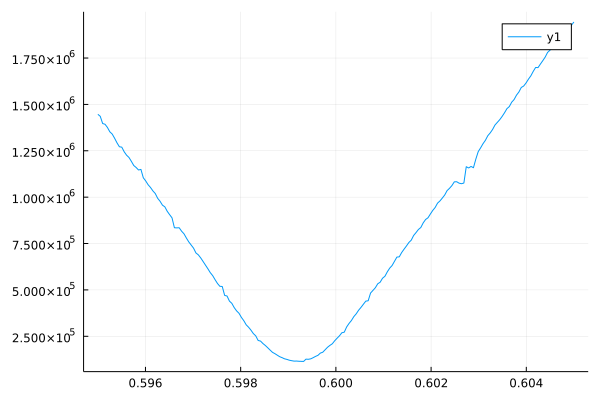

In [49]:
plot(tested_pers_late, model_vars_late)

#### Sanity check to make sure moving average is performing well

In [50]:
phase_late, flux_late_folded = fold(time_late, flux_late, 0.5993216)
smoothed_late = movmean(flux_late_folded, 200)

1793-element Vector{Float64}:
 30806.215158030835
 30807.89572926012
 30810.055102957973
 30804.41213537122
 30800.590935916844
 30796.50446612486
 30793.1766870136
 30792.428778134563
 30792.260456169144
 30790.995199131423
 30790.453114520053
 30792.1339469254
 30790.07295905357
     ⋮
 31583.41121806417
 31579.955221601165
 31575.327034711838
 31570.48243266918
 31565.29761895703
 31561.46312765791
 31556.23334771507
 31553.74498266464
 31550.99160223798
 31541.396306822313
 31537.938161957496
 31536.995408370647

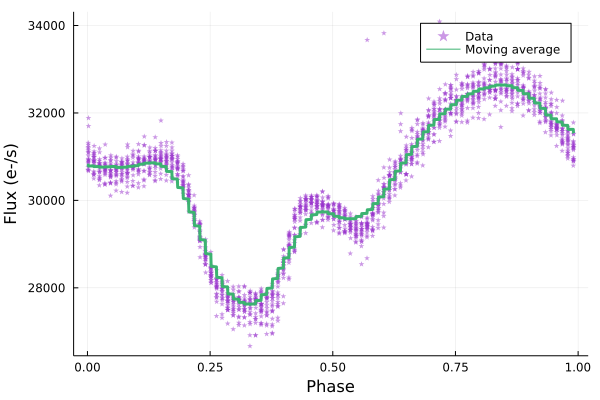

In [51]:
scatter(phase_late, flux_late_folded, marker=:star5, color=:darkorchid, msw=0,
        xlabel="Phase", ylabel="Flux (e-/s)", label="Data", markersize=3, alpha=0.5)
plot!(phase_late, smoothed_late, color=:mediumseagreen, label="Moving average", lw=3)

### Plot phase-folded versions of the early and late data

This is Figure 13

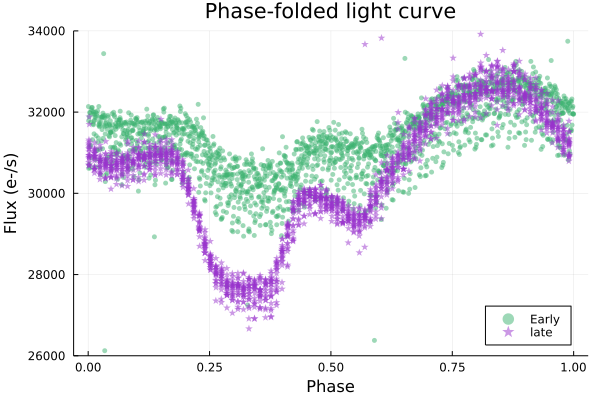

In [52]:
phased_plot = scatter(phase_early, flux_early_folded, color=:mediumseagreen, msw=0,
                      xlabel="Phase", ylabel="Flux (e-/s)", label="Early", markersize=3, 
                      alpha=0.5, title="Phase-folded light curve", ylim=(2.6e4, 3.4e4),
                      legend=:bottomright)

scatter!(phase_late, flux_late_folded, color=:darkorchid, msw=0, markersize=4, alpha=0.5,
         marker=:star5, label="late")
# savefig("scallop_folded.png")